In [2]:
import os, json

DATA_ROOT = r"C:\Users\User\Documents\Python\project_1\pj\medicine\data\raw"
ANN_ROOT = os.path.join(DATA_ROOT, "train_annotations")

def collect_unique_cats(ann_root):
    cat_ids = set()
    for dirpath, _, filenames in os.walk(ann_root):
        for fn in filenames:
            if not fn.lower().endswith(".json"):
                continue
            jp = os.path.join(dirpath, fn)
            with open(jp, "r", encoding="utf-8") as f:
                coco = json.load(f)
            for ann in coco["annotations"]:
                cat_ids.add(ann["category_id"])
    return sorted(list(cat_ids))

unique_cats = collect_unique_cats(ANN_ROOT)
print("unique category count:", len(unique_cats))
print("example ids:", unique_cats)


unique category count: 56
example ids: [1900, 2483, 3351, 3483, 3544, 3743, 3832, 4543, 12081, 12247, 12778, 13395, 13900, 16232, 16262, 16548, 16551, 16688, 18147, 18357, 19232, 19552, 19607, 19861, 20014, 20238, 20877, 21325, 21771, 22074, 22347, 22362, 24850, 25367, 25438, 25469, 27733, 27777, 27926, 27993, 28763, 29345, 29451, 29667, 30308, 31863, 31885, 32310, 33009, 33208, 33880, 34597, 35206, 36637, 38162, 41768]


# 설명: 고유 카테고리 수집

- 이 셀은 파일 시스템과 JSON을 처리하기 위해 `os`와 `json` 모듈을 import 합니다.
- `DATA_ROOT`, `ANN_ROOT`는 데이터(원시 이미지 및 주석)의 루트 경로를 지정합니다. Windows 경로를 문자열로 직접 쓰고 있습니다.

### 함수: collect_unique_cats(ann_root)
- 목적: 주석(`.json`) 파일들을 순회하며 `annotations` 배열에 있는 `category_id` 값들을 모아 **중복 제거된 정렬 리스트**로 반환합니다.
- 구현 포인트:
  - `os.walk(ann_root)`로 디렉터리 하위 모든 파일을 순회합니다.
  - 파일명이 `.json`으로 끝나지 않으면 건너뜁니다 (`str.lower().endswith`) — 대/소문자 구분을 피하기 위함.
  - 파일을 열 때 `encoding="utf-8"`을 명시하여 인코딩 문제를 예방합니다.
  - JSON을 `json.load`로 파싱한 후 `coco["annotations"]`를 읽어 `category_id`를 `set`에 추가합니다.
  - 반환 시에는 `sorted(list(cat_ids))`로 정렬된 리스트를 만듭니다.

### 문법/함수 설명
- `os.walk`: 주어진 디렉터리 아래 모든 파일/폴더를 트리 구조로 순회합니다.
- `fn.lower().endswith(".json")`: 파일 확장자를 소문자 기준으로 검사하여 `.JSON`처럼 대문자 확장자도 처리합니다.
- `json.load(f)`: 파일 객체에서 JSON을 파싱합니다.
- `set()`: 중복을 제거하는 데 사용합니다. 결과를 정렬하려면 list로 변환 후 `sorted` 사용.

### 작성 이유 / 유의점
- 데이터셋에 어떤 클래스(카테고리)가 있는지 미리 알아야 모델의 출력 클래스 수(`NUM_CLASSES`)와 라벨 매핑을 만들 수 있습니다.
- 현재 구현은 `coco["annotations"]`가 항상 존재한다고 가정합니다. 더 안전하게 하려면 `coco.get("annotations", [])`를 사용해 KeyError를 피할 수 있습니다.

In [3]:
# background = 0, 나머지 클래스는 1~K
catid_to_model = {cat_id: i+1 for i, cat_id in enumerate(unique_cats)}
model_to_catid = {v: k for k, v in catid_to_model.items()}

NUM_CLASSES = 1 + len(unique_cats)
print("NUM_CLASSES:", NUM_CLASSES)


NUM_CLASSES: 57


# 설명: 모델 내부 라벨 매핑과 클래스 수 계산

- 목적: 데이터셋에서 수집한 원래 `category_id`를 모델에서 사용할 연속된 라벨로 매핑하고, 역매핑을 만들어서 추후 시각화나 평가 시 원래 카테고리로 되돌릴 수 있게 합니다.

### 코드 설명
- `catid_to_model = {cat_id: i+1 for i, cat_id in enumerate(unique_cats)}`
  - `enumerate`로 인덱스를 붙여 반복하고, 모델 라벨은 `1..K`로 배정(배경 `0` 예약).
  - 이유: detector 모델(예: Faster R-CNN)은 클래스 0을 background로 기대하는 경우가 많아 1부터 실제 클래스 라벨을 사용합니다.
- `model_to_catid = {v: k for k, v in catid_to_model.items()}`
  - 모델의 출력(label)에서 원래의 `category_id`를 찾을 때 사용합니다.
- `NUM_CLASSES = 1 + len(unique_cats)`
  - background(1) + 실제 클래스 수

### 문법/함수 설명
- dict comprehension: 간결하게 사전(mapping)을 생성할 때 사용됩니다.

### 작성 이유 / 유의점
- 모델의 출력 interpretable(해석 가능)하도록 원래 카테고리 ID와 이름으로 다시 매핑할 수 있어야 합니다.
- 만약 `unique_cats`가 비어있다면 `NUM_CLASSES`는 1(단지 background)으로 계산됩니다. 이는 데이터 확인 시 중요한 신호입니다.

총 이미지 수: 763
총 bbox 수: 763
클래스 수: 56
잘못된 bbox 개수: 1


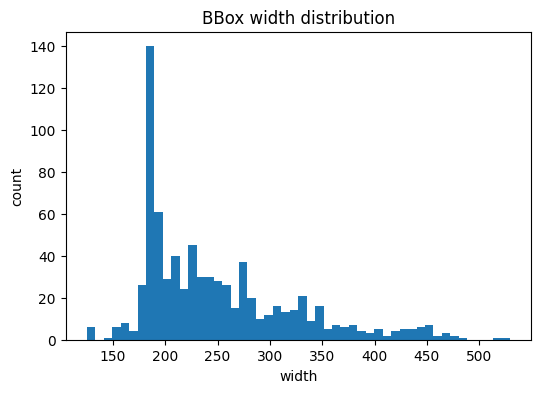

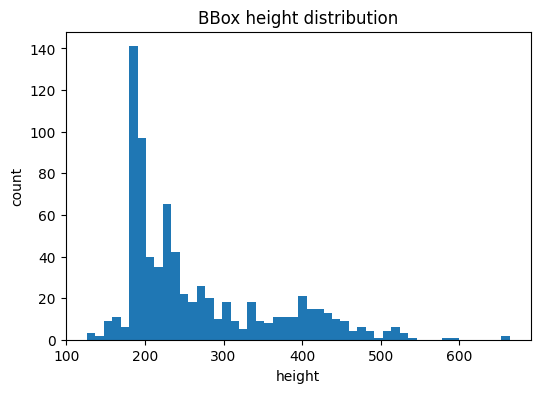

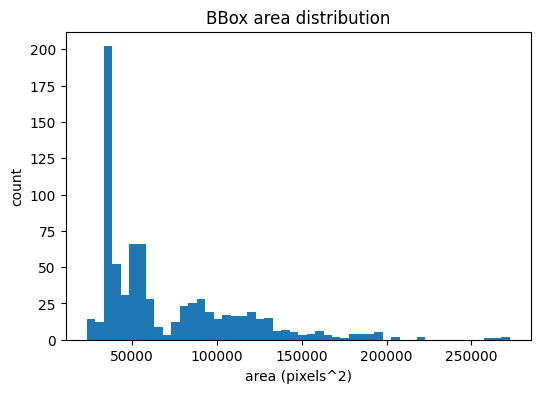

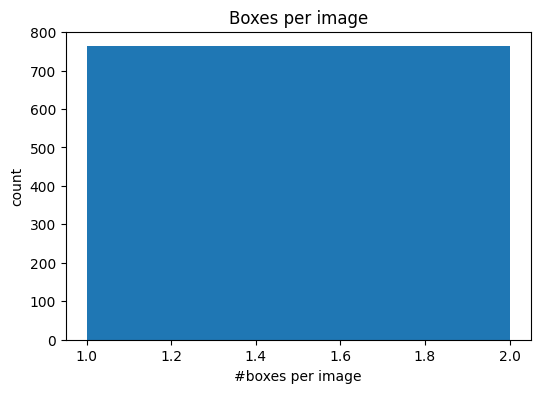

In [4]:
import os, json
import numpy as np
from collections import Counter, defaultdict
import matplotlib.pyplot as plt

ANN_ROOT = os.path.join(DATA_ROOT, "train_annotations")  # 네 경로에 맞게

all_widths = []
all_heights = []
all_areas = []
boxes_per_image = []
cat_freq = Counter()
image_sizes = []
invalid_bboxes = []
image_to_cats = defaultdict(set)

for dirpath, _, filenames in os.walk(ANN_ROOT):
    for fn in filenames:
        if not fn.lower().endswith(".json"):
            continue
        jp = os.path.join(dirpath, fn)
        with open(jp, "r", encoding="utf-8") as f:
            coco = json.load(f)

        img = coco["images"][0]
        W, H = img["width"], img["height"]
        image_id = img["id"]
        image_sizes.append((W, H))

        anns = coco["annotations"]
        boxes_per_image.append(len(anns))

        for ann in anns:
            x, y, w, h = ann["bbox"]
            cat_id = ann["category_id"]

            # bbox 기본 유효성 체크
            if w <= 0 or h <= 0 or x < 0 or y < 0 or x + w > W or y + h > H:
                invalid_bboxes.append({
                    "file": fn,
                    "bbox": ann["bbox"],
                    "img_size": (W, H),
                    "cat_id": cat_id,
                })

            all_widths.append(w)
            all_heights.append(h)
            all_areas.append(w * h)
            cat_freq[cat_id] += 1
            image_to_cats[image_id].add(cat_id)

print(f"총 이미지 수: {len(image_sizes)}")
print(f"총 bbox 수: {len(all_areas)}")
print(f"클래스 수: {len(cat_freq)}")
print(f"잘못된 bbox 개수: {len(invalid_bboxes)}")

# bbox 너비/높이/면적 분포
plt.figure(figsize=(6,4))
plt.hist(all_widths, bins=50)
plt.title("BBox width distribution")
plt.xlabel("width"); plt.ylabel("count")
plt.show()

plt.figure(figsize=(6,4))
plt.hist(all_heights, bins=50)
plt.title("BBox height distribution")
plt.xlabel("height"); plt.ylabel("count")
plt.show()

plt.figure(figsize=(6,4))
plt.hist(all_areas, bins=50)
plt.title("BBox area distribution")
plt.xlabel("area (pixels^2)"); plt.ylabel("count")
plt.show()

# 이미지당 박스 개수 분포
plt.figure(figsize=(6,4))
plt.hist(boxes_per_image, bins=range(1, max(boxes_per_image)+2))
plt.title("Boxes per image")
plt.xlabel("#boxes per image"); plt.ylabel("count")
plt.show()


# 설명: 데이터셋 통계 및 시각화(박스/크기/잘못된 bbox 확인)

- 목적: 전체 annotation을 훑어보면서 이미지 크기, bbox 너비/높이/면적, 클래스 빈도, 그리고 잘못된(유효하지 않은) bounding box를 탐지하여 데이터 품질을 확인합니다.

### 주요 변수
- `all_widths`, `all_heights`, `all_areas`: bbox의 너비/높이/면적 분포를 수집합니다.
- `boxes_per_image`: 이미지 당 박스 개수 분포를 기록합니다.
- `cat_freq`(Counter): 클래스별 빈도수 집계에 사용됩니다.
- `invalid_bboxes`: bbox가 이미지 경계 밖으로 나가거나 너비/높이가 음수/0인 경우를 기록합니다.

### 코드 동작(라인별 핵심)
- `for dirpath, _, filenames in os.walk(ANN_ROOT)`: 모든 JSON 파일을 순회합니다.
- 각 JSON에서 `img = coco['images'][0]`로 이미지 정보를 얻습니다. (`W`,`H`) — 주석 형식에 따라 1개 이미지가 가정됨.
- 모든 `anns`를 순회하며 `x,y,w,h`를 가져오고 기본 유효성 체크(예: `w <= 0`, `x + w > W`)로 잘못된 박스들을 `invalid_bboxes`에 저장합니다.
- `all_widths.append(w)` 등으로 통계 수집을 수행합니다.

### 시각화
- `matplotlib.pyplot`의 `hist`를 이용하여 width/height/area와 이미지당 박스 수 분포를 확인합니다.
- `bins`나 `range` 설정으로 적절한 분해능을 지정합니다.

### 문법/함수 설명
- `Counter()`: 빈도수 집계(클래스 분포 분석)에 유용합니다.
- `defaultdict(set)`: 이미지별 등장 카테고리를 집합으로 관리하여 중복 카운트 방지 및 빠른 조회 가능.
- `plt.hist`: 분포 시각화.

### 작성 이유 / 유의점
- 데이터 분포와 이상치(invalid bbox)를 사전에 파악하는 것은 검출 모델 성능 개선에 매우 중요합니다. 잘못된 주석이 많다면 학습 전에 정제나 보정이 필요합니다.
- `img = coco['images'][0]`는 JSON마다 images 배열의 길이가 1이라고 가정하고 있습니다. 다수 이미지가 있는 파일 형식이라면 추가 처리가 필요합니다.

In [5]:
print(invalid_bboxes)

[{'file': 'K-003351-016262-018357_0_2_0_2_75_000_200.json', 'bbox': [6567, 625, 311, 315], 'img_size': (976, 1280), 'cat_id': 18357}]


# 설명: 잘못된 bbox 리스트 확인

- 간단히 `invalid_bboxes` 리스트의 내용을 출력합니다.
- 작성 이유:
  - 위 통계 셀에서 수집된 잘못된 박스들을 직접 확인해 어떤 유형의 문제가 있는지(음수 좌표, 크기 초과 등)를 파악할 수 있습니다.
- 실행 시 주의:
  - 출력이 길면 노트북이 복잡해질 수 있으므로 필요 시 일부 항목만 샘플로 출력하는 것이 좋습니다.

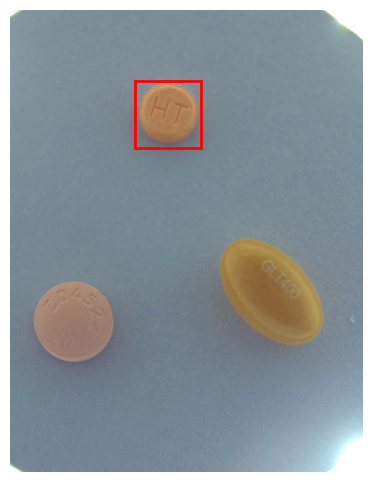

In [6]:
from PIL import Image

IMG_ROOT = os.path.join(DATA_ROOT, "train_images")

def find_json_path(root_dir, filename):
    for dirpath, _, filenames in os.walk(root_dir):
        if filename in filenames:
            return os.path.join(dirpath, filename)
    return None

def show_problem_sample(rec):
    fn_json = rec["file"]
    
    # [수정] 단순히 os.path.join을 쓰는 대신 find_json_path로 하위 폴더까지 검색하여 실제 경로를 찾습니다.
    json_path = find_json_path(ANN_ROOT, fn_json)
    
    # 파일이 없는 경우에 대한 예외 처리
    if json_path is None:
        print(f"Error: {fn_json} 파일을 {ANN_ROOT} 및 하위 폴더에서 찾을 수 없습니다.")
        return

    # 찾은 경로(json_path)를 사용하여 파일을 엽니다.
    with open(json_path, "r", encoding="utf-8") as f:
        coco = json.load(f)
        
    img_info = coco["images"][0]
    img_path = os.path.join(IMG_ROOT, img_info["file_name"])
    img = Image.open(img_path).convert("RGB")

    import matplotlib.pyplot as plt
    import matplotlib.patches as patches

    fig, ax = plt.subplots(1,1, figsize=(6,6))
    ax.imshow(img); ax.set_axis_off()

    for ann in coco["annotations"]:
        x, y, w, h = ann["bbox"]
        rect = patches.Rectangle(
            (x, y), w, h,
            linewidth=2,
            edgecolor="red",
            facecolor="none",
        )
        ax.add_patch(rect)
    plt.show()

# invalid가 있다면 첫 샘플 확인
if invalid_bboxes:
    show_problem_sample(invalid_bboxes[0])

# 설명: 문제 샘플 시각화 함수 (`show_problem_sample`)

- 목적: `invalid_bboxes`에 기록된 문제(예: 이미지 바깥으로 벗어난 상자 등)를 실제 이미지 상에서 시각적으로 확인합니다.

### 주요 부분 설명
- `img = Image.open(img_path).convert("RGB")`:
  - PIL을 사용해 이미지를 로드하고 RGB로 강제 변환합니다(채널 일관성 확보).
- `patches.Rectangle((x, y), w, h, ...)`:
  - matplotlib에서 박스를 그리기 위한 도형 객체입니다. 좌표와 너비/높이를 그대로 전달합니다.
- `show_problem_sample(invalid_bboxes[0])`:
  - `invalid_bboxes`가 있을 경우, 첫번째 문제 샘플을 열어 어떤 형태의 주석 문제가 있는지 시각적으로 확인합니다.

### 작성 이유 / 유의점
- 텍스트로만 문제를 볼 때보다 이미지에 박스를 그려 보면 문제의 원인을 더 쉽게 파악할 수 있습니다(좌표 축이 반대/잘못 추출된 경우 등).
- `invalid_bboxes` 내용을 시각적으로 검토한 뒤 주석 편집 또는 필터링 로직을 추가할지 결정할 수 있습니다.

In [7]:
import os
# category_id -> name 만들기
catid_to_name = {}
for dirpath, _, filenames in os.walk(ANN_ROOT):
    for fn in filenames:
        if not fn.lower().endswith(".json"):
            continue
        jp = os.path.join(dirpath, fn)
        with open(jp, "r", encoding="utf-8") as f:
            coco = json.load(f)
        for cat in coco.get("categories", []):
            catid_to_name[cat["id"]] = cat.get("name", "")

print("Top 10 (id, name, count):")
for cat_id, cnt in cat_freq.most_common(10):
    print(cat_id, catid_to_name.get(cat_id, ""), cnt)


Top 10 (id, name, count):
3351 일양하이트린정 2mg 153
3483 기넥신에프정(은행엽엑스)(수출용) 45
35206 아토젯정 10/40mg 37
16262 크레스토정 20mg 23
21325 아토르바정 10mg 22
16232 리피토정 20mg 21
3832 뉴로메드정(옥시라세탐) 20
20238 플라빅스정 75mg 20
36637 로수젯정10/5밀리그램 19
16548 가바토파정 100mg 18


# 설명: category_id -> name 매핑 수집

- 목적: 모든 주석 파일에서 `categories` 배열을 읽어 `category_id`에 해당하는 이름(예: 약 이름)을 모아서 `catid_to_name` 딕셔너리를 만듭니다.

### 코드 설명
- `for cat in coco.get("categories", [])`:
  - `get`을 사용하여 `categories` 키가 없을 경우 빈 리스트를 사용해 안전하게 순회합니다.
- `catid_to_name[cat["id"]] = cat.get("name", "")`:
  - `id`를 키로, `name`을 값으로 저장합니다. `name`이 없으면 빈 문자열로 대체합니다.

### 작성 이유
- 모델 예측 결과(display)에서 클래스 아이디만 있으면 사람이 해석하기 어렵습니다. 따라서 `id->name` 매핑을 만들어 시각화나 결과 문서화 시 원문 이름을 표시할 수 있게 합니다.

In [8]:
import os, json
import torch
from torch.utils.data import Dataset
from PIL import Image
import torchvision.transforms.v2.functional as F
from torchvision.tv_tensors import Image as TvImage, BoundingBoxes

class PillMergedDataset(Dataset):
    def __init__(self, root, split="train", transforms=None):
        
        self.root = root
        self.split = split
        self.transforms = transforms

        if split == "train":
            self.img_dir = os.path.join(root, "train_images")
            ann_root = os.path.join(root, "train_annotations")

            # file_name -> { "width": ..., "height": ..., "anns": [ann, ...], "cat_names": {cat_id: name} }
            file_to_info = {}

            for dirpath, _, filenames in os.walk(ann_root):
                for fn in filenames:
                    if not fn.lower().endswith(".json"):
                        continue
                    jp = os.path.join(dirpath, fn)
                    with open(jp, "r", encoding="utf-8") as f:
                        coco = json.load(f)

                    img = coco["images"][0]
                    file_name = img["file_name"]
                    width = img["width"]
                    height = img["height"]

                    if file_name not in file_to_info:
                        file_to_info[file_name] = {
                            "width": width,
                            "height": height,
                            "anns": [],
                            "cat_names": {},   # category_id -> name
                        }

                    # categories 배열에서 id -> name 매핑 저장
                    for cat in coco.get("categories", []):
                        cid = cat["id"]
                        cname = cat.get("name", "")
                        file_to_info[file_name]["cat_names"][cid] = cname

                    # annotations 추가
                    for ann in coco["annotations"]:
                        file_to_info[file_name]["anns"].append(ann)

            self.filenames = sorted(file_to_info.keys())
            self.file_to_info = file_to_info
            
        elif split == "test":
            self.img_dir = os.path.join(root, "test_images")
            self.filenames = sorted(
                f for f in os.listdir(self.img_dir)
                if f.lower().endswith(".png")
            )
            self.file_to_info = None

        else:
            raise ValueError(f"Unknown split: {split}")

    def __len__(self):
        return len(self.filenames)

    def _load_image(self, file_name: str):
        path = os.path.join(self.img_dir, file_name)
        img = Image.open(path).convert("RGB")
        return img

    def _load_target(self, file_name: str, image_id: int):
        info = self.file_to_info[file_name]
        anns = info["anns"]
        cat_names_map = info.get("cat_names", {})

        boxes, labels, areas, iscrowd = [], [], [], []
        names = []

        for ann in anns:
            x, y, w, h = ann["bbox"]
            if w <= 0 or h <= 0:
                continue

            orig_cat = ann["category_id"]
            if orig_cat not in catid_to_model:
                continue
            model_label = catid_to_model[orig_cat]

            boxes.append([x, y, x + w, y + h])
            labels.append(model_label)
            areas.append(ann.get("area", w * h))
            iscrowd.append(ann.get("iscrowd", 0))

            # category_id로부터 이름 가져오기 (없으면 빈 문자열)
            pill_name = cat_names_map.get(orig_cat, "")
            names.append(pill_name)

        if len(boxes) == 0:
            boxes = torch.zeros((0, 4), dtype=torch.float32)
            labels = torch.zeros((0,), dtype=torch.int64)
            areas = torch.zeros((0,), dtype=torch.float32)
            iscrowd = torch.zeros((0,), dtype=torch.int64)
            names = []
        else:
            boxes = torch.as_tensor(boxes, dtype=torch.float32)
            labels = torch.as_tensor(labels, dtype=torch.int64)
            areas = torch.as_tensor(areas, dtype=torch.float32)
            iscrowd = torch.as_tensor(iscrowd, dtype=torch.int64)

        target = {
            "boxes": boxes,
            "labels": labels,
            "image_id": torch.tensor([image_id]),
            "area": areas,
            "iscrowd": iscrowd,
            "names": names,   # 추가
        }
        return target



    def __getitem__(self, idx):
        file_name = self.filenames[idx]
        img = self._load_image(file_name)

        image_id = idx  # 학습 내부용 id

        if self.split == "train":
            target = self._load_target(file_name, image_id)
        else:
            target = {"image_id": torch.tensor([image_id])}

        img = TvImage(F.pil_to_tensor(img))  # [C,H,W], uint8

        if self.split == "train":
            target["boxes"] = BoundingBoxes(
                target["boxes"], format="XYXY", canvas_size=F.get_size(img)
            )

        if self.transforms is not None:
            img, target = self.transforms(img, target)

        return img, target


# 설명: `PillMergedDataset` 클래스(상세)

- 목적: COCO 형식의 JSON 주석들을 이미지 단위로 병합하여 PyTorch `Dataset` 인터페이스로 제공합니다. Faster R-CNN 같은 detector에서 기대하는 형태로 출력합니다.

### __init__에서 수행하는 일
- `root`, `split`, `transforms`를 저장합니다.
- `split == "train"`인 경우 `train_annotations` 폴더를 순회하여 각 이미지 파일명을 키로 하는 `file_to_info` 딕셔너리를 구성합니다:
  - `file_name` -> {width, height, anns, cat_names}
  - `categories` 정보에서 `id->name` 매핑을 저장합니다.
  - `annotations`들은 이미지별 리스트로 모읍니다.
- `split == "test"`인 경우에는 `test_images`의 `.png` 파일 목록만 읽습니다.

### _load_image
- PIL `Image.open(...).convert("RGB")`로 이미지를 읽어 채널 일관성을 보장합니다.

### _load_target
- `anns`를 순회하면서 COCO `bbox`(x, y, w, h)를 XYXY로 변환하여 `boxes`에 저장합니다.
- `orig_cat`이 `catid_to_model`에 없다면(데이터 정제 시 필요 없는 카테고리) 해당 어노테이션을 무시합니다.
- `areas`, `iscrowd`, 그리고 원래 카테고리에서 가져온 `names`(약 이름)를 함께 저장합니다.
- 객체가 없으면 빈 텐서를 만들어 모델이 기대하는 형식을 유지합니다.

### __getitem__
- 이미지 파일을 읽어 `TvImage(F.pil_to_tensor(img))`로 변환합니다(브릿지 역할: PIL -> tv_tensors).
- `target['boxes']`는 `BoundingBoxes` 타입으로 변환하여 torchvision의 유틸리티와 호환되도록 합니다.
- `transforms`가 있으면 `(img, target)` 쌍에 적용합니다.

### 문법/함수 설명
- `TvImage`와 `BoundingBoxes`는 torchvision의 새로운 tv_tensors API로, 텐서형 이미지와 박스를 다루는 유틸리티를 제공합니다.
- `torch.as_tensor`: 파이썬 리스트를 tensor로 변환합니다.

### 작성 이유 / 유의점
- JSON이 이미지 단위로 여러 파일에 흩어져 있는 경우, 이를 한 데이터셋으로 합쳐야 모델 학습 데이터로 사용하기 쉽습니다.
- annotation의 무결성(잘못된 bbox, 없는 카테고리 등)을 고려하여 필터링 로직(`if orig_cat not in catid_to_model: continue`)을 넣어 안정성을 확보합니다.

In [9]:
def show_sample(dataset, idx=0):
    img, target = dataset[idx]

    if isinstance(img, TvImage):
        img_pil = F.to_pil_image(img).convert("RGB")
    else:
        img_pil = F.to_pil_image(img)

    boxes = target.get("boxes", None)
    labels = target.get("labels", None)
    names = target.get("names", None)

    if isinstance(boxes, BoundingBoxes):
        boxes = torch.as_tensor(boxes, dtype=torch.float32)

    fig, ax = plt.subplots(1, 1, figsize=(8, 8))
    ax.imshow(img_pil)
    ax.set_axis_off()

    if boxes is not None and len(boxes) > 0:
        for i, box in enumerate(boxes):
            x1, y1, x2, y2 = box.tolist()
            w = x2 - x1
            h = y2 - y1

            rect = patches.Rectangle(
                (x1, y1), w, h,
                linewidth=2,
                edgecolor="red",
                facecolor="none"
            )
            ax.add_patch(rect)

            # pill 이름 텍스트 구성
            text = ""
            if names is not None and i < len(names) and names[i]:
                text = names[i]
            elif labels is not None and len(labels) > i:
                text = f"id={int(labels[i])}"

            ax.text(
                x1, max(y1 - 3, 0),
                text,
                fontsize=11,
                color="blue",
                bbox=dict(facecolor="white", edgecolor="white", alpha=0.9, pad=2)
            )

    ax.set_title(f"index={idx}, image_id={int(target['image_id'][0])}")
    plt.tight_layout()
    plt.show()


# 설명: `show_sample` — 데이터 샘플 시각화

- 목적: 데이터셋에서 특정 인덱스의 이미지를 시각화하고, 어노테이션(박스와 라벨/이름)을 오버레이하여 확인합니다.

### 주요 동작
- `img`가 `TvImage` 인지 확인하여 적절히 PIL 이미지로 변환합니다 (`F.to_pil_image`).
- `BoundingBoxes` 타입인 경우 텐서로 변환해서 좌표를 다룹니다.
- 각 `box`에 대해 matplotlib의 `patches.Rectangle`를 이용해 사각형을 그리고, 텍스트(이름 또는 id)를 추가합니다.
- `ax.set_title`에 `index`와 `image_id`를 표기해 어떤 샘플인지 쉽게 확인하게 합니다.

### 문법/함수 설명
- `F.to_pil_image`: tv_tensor 또는 tensor를 PIL 이미지로 변환합니다.
- `patches.Rectangle`: 사각형을 그리는 matplotlib 객체입니다.
- `ax.text(..., bbox=dict(...))`: 텍스트 배경을 하얗게 처리하여 글자가 이미지와 겹쳐도 가독성이 유지되도록 합니다.

### 작성 이유 / 유의점
- 데이터가 올바르게 파싱되었는지, 박스와 라벨이 시각적으로 일치하는지를 빠르게 검사할 수 있습니다.
- 이미지 좌표계(픽셀 기준)와 박스 좌표가 일치하지 않으면 이상치를 감지할 수 있습니다.

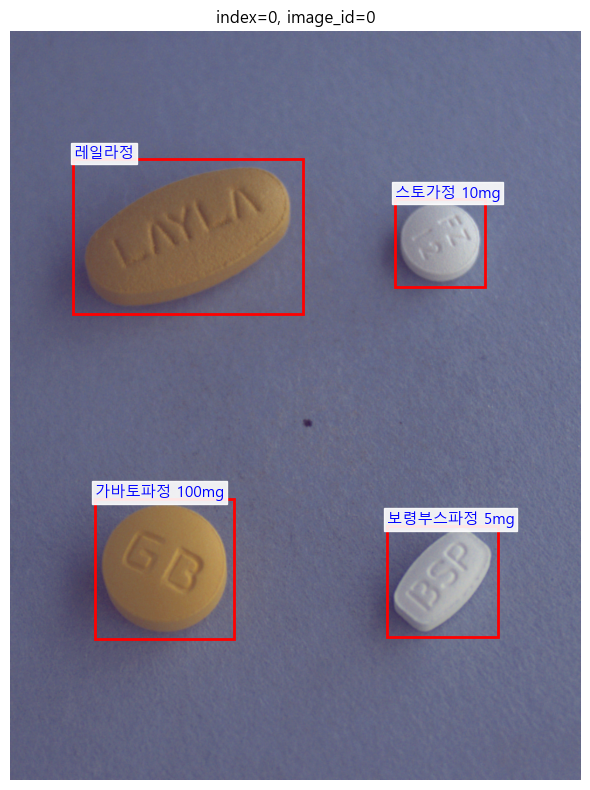

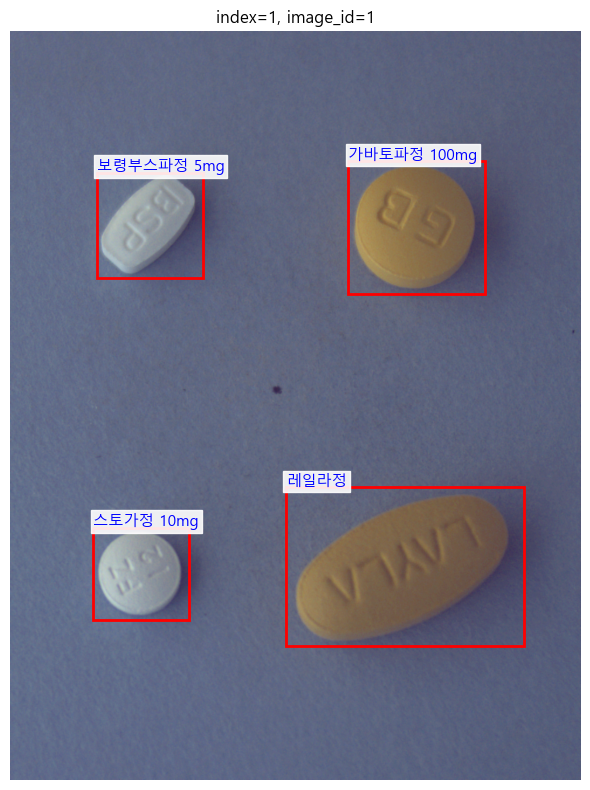

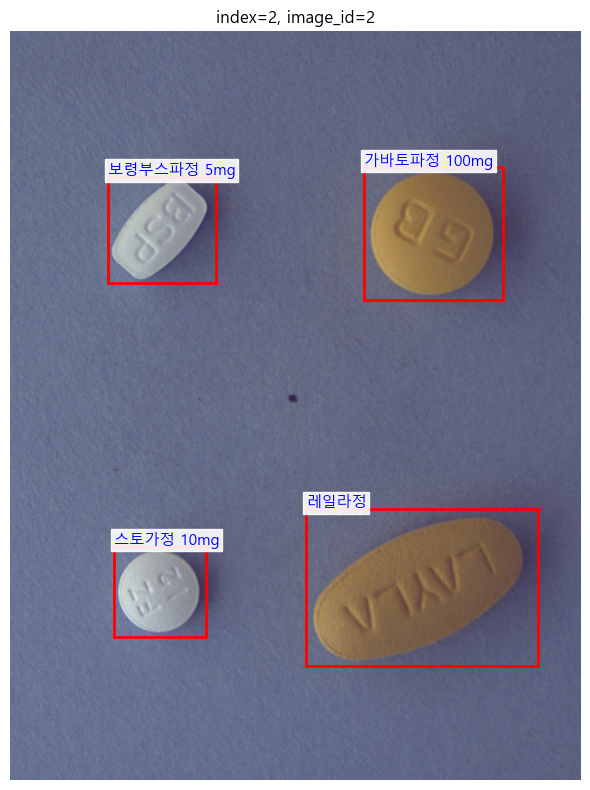

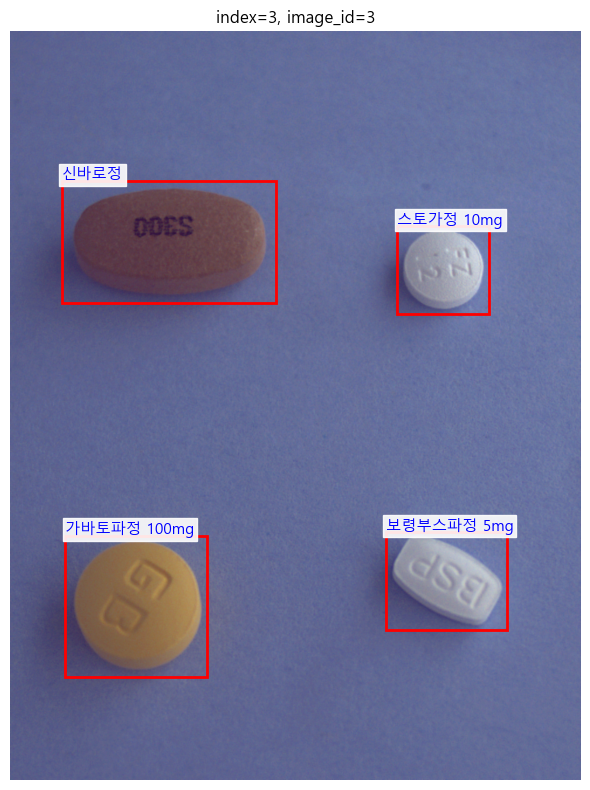

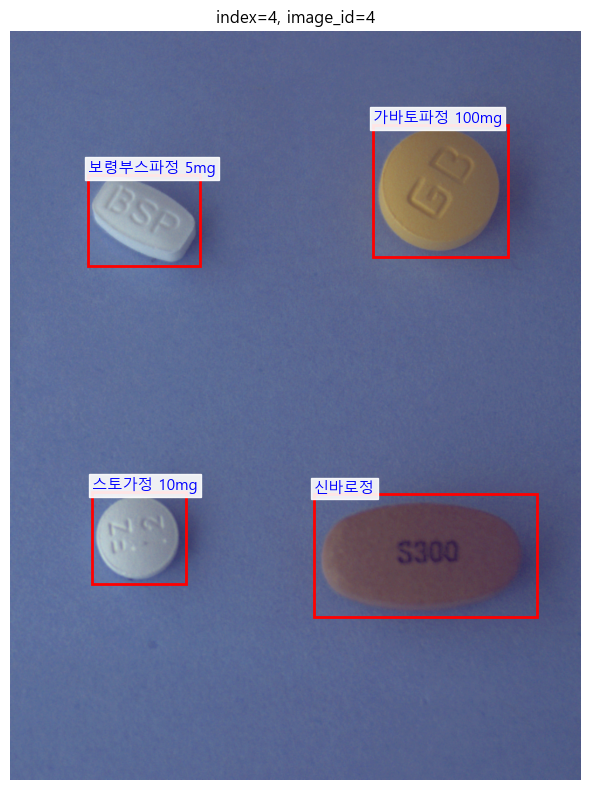

In [10]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib import font_manager, rc

# 한글 설정 - 윈도우
font_path = "C:/Windows/Fonts/malgun.ttf"
font = font_manager.FontProperties(fname=font_path).get_name()
rc('font', family=font)

# 마이너스 깨짐 방지
plt.rcParams['axes.unicode_minus'] = False

ds = PillMergedDataset(root=DATA_ROOT, split="train", transforms=None)
for i in range(5):
    show_sample(ds, idx=i)


# 설명: 한글 폰트 설정 및 샘플 시각화 실행

- 목적: matplotlib 출력에서 한글이 깨지지 않도록 Windows의 `malgun.ttf`를 기본 폰트로 설정하고, `PillMergedDataset`의 샘플들을 시각화합니다.

### 코드 해설
- `font_manager.FontProperties(fname=font_path).get_name()`:
  - 폰트 파일 경로로부터 시스템 폰트 이름을 얻어 `rc('font', family=font)`로 설정합니다.
- `plt.rcParams['axes.unicode_minus'] = False`:
  - 마이너스 기호가 깨져 보이는 현상을 방지합니다.
- `ds = PillMergedDataset(root=data_root, split="train", transforms=None)`:
  - transforms 없이 원본 이미지를 확인하려고 인스턴스를 생성합니다.
- `for i in range(5): show_sample(ds, idx=i)`:
  - 처음 5개 샘플을 시각화하여 어노테이션 품질을 확인합니다.

### 작성 이유 / 유의점
- 한국어 라벨(약 이름 등)을 시각화할 때 폰트가 없으면 한글이 네모로 나오거나 깨질 수 있어 운영체제의 글꼴을 직접 지정합니다.
- 노트북 환경에 따라 폰트 파일 경로가 달라질 수 있으므로, 다른 환경에서 사용할 때는 폰트 경로를 확인해야 합니다.

In [11]:
img, target = ds[3]   # index=3 이미지
print("boxes:", target["boxes"])
print("labels:", target["labels"])
print("names:", target.get("names"))


boxes: BoundingBoxes([[ 642.,  856.,  850., 1023.],
               [  94.,  862.,  336., 1104.],
               [ 662.,  333.,  819.,  483.],
               [  88.,  255.,  454.,  464.]], format=BoundingBoxFormat.XYXY, canvas_size=[1280, 976], clamping_mode=soft)
labels: tensor([ 1, 16, 23, 49])
names: ['보령부스파정 5mg', '가바토파정 100mg', '스토가정 10mg', '신바로정']


# 설명: 단일 샘플의 메타데이터 확인

- `img, target = ds[3]`: 데이터셋에서 인덱스 3의 샘플을 로드합니다.
- `print("boxes:", target["boxes"].shape)`: 박스 텐서의 모양을 출력하여 객체 수와 좌표 차원 확인
- `print("labels:", target["labels"])`: 레이블 텐서를 출력하여 정상적인 라벨 값 범위(1..K)를 확인
- `print("names:", target.get("names"))`: 원래 카테고리 이름(약 이름) 리스트를 확인

### 작성 이유
- 포맷과 데이터 구조(예: `BoundingBoxes` 타입, 라벨/이름의 길이 등)를 빠르게 점검하기 위한 간단한 디버깅 단계입니다.

In [12]:
import torchvision.transforms.v2 as T

train_transform = T.Compose([
    T.ToDtype(torch.float32, scale=True),        # [0,255] → [0,1]
    T.RandomHorizontalFlip(p=0.5),
    T.RandomResize(min_size=640, max_size=800),  # 짧은 변 기준 resize
    T.Normalize(mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)),
])

test_transform = T.Compose([
    T.ToDtype(torch.float32, scale=True),
    T.Resize(640),
    T.Normalize(mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)),
])

# 설명: 학습/테스트용 Transform 정의 (torchvision.transforms.v2 사용)

- 목적: 이미지와 관련 타깃을 학습(Train) 및 평가(Test) 시에 적절한 크기 및 정규화로 변환하도록 Transform을 정의합니다.

### train_transform
- `T.ToDtype(torch.float32, scale=True)`: uint8 [0,255] -> float32 [0,1]로 스케일링하여 신경망 입력 범위에 맞춥니다.
- `T.RandomHorizontalFlip(p=0.5)`: 데이터 증강(좌우 뒤집기)으로 일반화 성능 향상.
- `T.RandomResize(min_size=640, max_size=800)`: 짧은 변을 기준으로 무작위 리사이즈(다양한 스케일에 대해 학습).
- `T.Normalize(mean=..., std=...)`: ImageNet 통상값으로 입력을 정규화합니다.

### test_transform
- `T.Resize(640)`: 일관된 평가 입력 크기로 고정합니다.

### 문법/함수 설명
- `T.Compose`: 여러 변환을 순서대로 적용하기 위한 컨테이너
- `scale=True`는 내부적으로 `div=255.0` 처리와 유사합니다.

### 작성 이유 / 유의점
- 학습 시에는 augmentation과 다양한 크기 처리가 도움이 되지만, 평가 시에는 일관된 입력 크기가 필요하므로 test에는 고정 크기를 사용하는 것이 일반적입니다.

In [13]:
DATA_ROOT = r"C:\Users\User\Documents\Python\project_1\pj\medicine\data\raw"

train_dataset = PillMergedDataset(
    root=DATA_ROOT,
    split="train",
    transforms=train_transform
)

test_dataset = PillMergedDataset(
    root=DATA_ROOT,
    split="test",
    transforms=test_transform
)

# 설명: `PillMergedDataset` 인스턴스 생성(학습/테스트)

- `train_dataset = PillMergedDataset(root=DATA_ROOT, split="train", transforms=train_transform)`
  - 학습에 사용할 데이터셋 인스턴스를 생성합니다. `transforms`를 전달하여 이미지 및 타깃이 배치에 맞는 텐서 형태로 전처리됩니다.
- `test_dataset = PillMergedDataset(root=DATA_ROOT, split="test", transforms=test_transform)`
  - 테스트(예측) 시에는 annotation이 없더라도 이미지 로드와 변환을 수행하기 위해 인스턴스를 생성합니다.

### 작성 이유
- 데이터셋을 분리하여 학습/평가 파이프라인을 명확히 구성합니다.
- `transforms`는 데이터 일관성과 모델 입력 포맷을 보장합니다.

In [14]:
#Detection용 collate_fn. 리스트 그대로 넘기도록 따로 정의
def detection_collate_fn(batch):
    """
    batch: [(img1, target1), (img2, target2), ...]
    return: (list_of_images, list_of_targets)
    """
    images = [b[0] for b in batch]
    targets = [b[1] for b in batch]
    return images, targets


# 설명: detection용 collate_fn 정의

- 목적: DataLoader가 반환하는 배치에서 이미지(다양한 크기)와 타깃을 그대로 리스트 형태로 반환하도록 `collate_fn`을 커스텀합니다.

### 이유
- 객체 검출의 경우 동일한 배치 내에서 이미지의 공간 크기가 달라 텐서로 곧바로 스택(stack)할 수 없습니다. 따라서 이미지를 `[img1, img2, ...]`와 같은 리스트로 전달하고, 모델 사이드에서 배치 처리를 하도록 합니다.

### 문법/함수 설명
- `collate_fn`은 PyTorch `DataLoader`에 전달되며, `batch`는 `(img, target)` 쌍의 리스트입니다. 반환 형식을 모델이 기대하는 형태로 맞추면 됩니다.

### 유의점
- 사용자 정의 collate_fn을 사용하면 DataLoader의 `batch_size`는 여전히 미니배치 크기를 의미하지만, 모델 코드에서 배치 처리를 잘 처리하는지 확인해야 합니다.

In [15]:
from torch.utils.data import DataLoader
BATCH_SIZE = 4

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    collate_fn=detection_collate_fn,

    pin_memory=True,
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    collate_fn=detection_collate_fn,
    pin_memory=True,
)


# 설명: DataLoader 생성 및 사용법

- `BATCH_SIZE = 4`로 Mini-batch 크기를 지정합니다.
- `train_loader`와 `test_loader`를 `DataLoader`로 생성할 때 `collate_fn=detection_collate_fn`을 지정하여 이미지/타깃을 리스트 형태로 유지합니다.
- `pin_memory=True`는 CUDA 사용 시 호스트->디바이스 전송 성능을 개선할 수 있습니다.

### 문법/함수 설명
- `DataLoader(dataset, batch_size, shuffle, collate_fn, pin_memory)` 형태로 콜백과 옵션을 제공합니다.

### 작성 이유 / 유의점
- Detetion 모델은 배치 내부의 이미지가 다른 크기일 가능성이 높기 때문에 기본 collate 방식을 그대로 쓰면 오류가 발생할 수 있습니다. 이를 방지하기 위해 커스텀 collate_fn을 제공합니다.
- `shuffle=True`는 학습 시 데이터 섞기를 보장합니다. 평가 시에는 `shuffle=False`로 설정합니다.

In [16]:
images, targets = next(iter(train_loader))
print(len(images), type(images[0]), images[0].shape)
print(len(targets), targets[0].keys(), targets[0]["boxes"].shape)


4 <class 'torchvision.tv_tensors._image.Image'> torch.Size([3, 840, 641])
4 dict_keys(['boxes', 'labels', 'image_id', 'area', 'iscrowd', 'names']) torch.Size([3, 4])


# 설명: DataLoader로부터 배치 하나를 읽어 데이터 구조 확인

- `images, targets = next(iter(train_loader))`:
  - `train_loader`에서 iterator를 만들고 첫 번째 배치를 가져옵니다.
- 출력 내용 설명:
  - `len(images)`는 배치 크기(예: 4)를 의미하며, `type(images[0])`은 `TvImage` 또는 tensor일 수 있습니다.
  - `targets[0].keys()`로 target dict의 키들(예: `boxes`, `labels`, `image_id`, `area`, `iscrowd`, `names`)을 확인합니다.

### 작성 이유
- 배치 구조가 모델이 기대하는 포맷과 맞는지 빠르게 확인하기 위한 디버깅용 코드입니다.

In [17]:
import torchvision
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

def create_model(num_classes: int):
    # COCO pretrained Faster R-CNN
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(
        weights="COCO_V1"
    )
    in_features = model.roi_heads.box_predictor.cls_score.in_features

    # num_classes = (클래스 수 + 1, background 포함)
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    return model


# 설명: 모델 생성 유틸리티(`create_model`)

- 목적: torchvision에서 COCO로 사전학습된 Faster R-CNN을 불러오고, 해당 모델의 classifier(예: `box_predictor`)를 현재 데이터셋의 클래스 수에 맞게 교체합니다.

### 코드 설명
- `weights="COCO_V1"`: COCO 데이터로 사전학습된 가중치를 로드합니다.
- `in_features = model.roi_heads.box_predictor.cls_score.in_features`:
  - 마지막 분류기의 입력 feature 차원을 추출합니다.
- `model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)`:
  - 클래스 수(`num_classes`)에 맞춰 새 예측기를 설정합니다.

### 문법/함수 설명
- `FastRCNNPredictor`: Faster R-CNN의 box head를 편리하게 교체할 수 있는 helper 클래스입니다.

### 작성 이유 / 유의점
- 사전학습된 백본을 그대로 쓰면서 최종 출력 클래스만 바꾸는 것은 전이학습(transfer learning)의 일반적인 패턴입니다.
- `num_classes`는 반드시 background를 포함한 총 클래스 수여야 합니다.

In [18]:
for images, targets in train_loader:
    labels = targets[0]["labels"]
    print("min label:", labels.min().item(), "max label:", labels.max().item())
    break


min label: 3 max label: 25


# 설명: 레이블 범위 확인 (데이터 검증)

- 목적: 데이터로더에서 가져온 첫 배치의 라벨 값들이 `1..K` 범위(모델 레이블)인지 확인합니다.
- `labels.min().item()` / `labels.max().item()`로 최소/최대 라벨을 출력하여 불일치(예: 0 포함 또는 너무 큰 값)를 점검합니다.

### 작성 이유
- 라벨 인덱싱이 잘못되면 손실 함수 또는 예측 해석 시 오류가 발생할 수 있으므로 초기 확인입니다.

In [19]:
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
lr = 0.01

model = create_model(NUM_CLASSES)
model.to(device)

params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(
    params,
    lr=lr,
    momentum=0.9,
    weight_decay=0.0005,
)
lr_scheduler = torch.optim.lr_scheduler.StepLR(
    optimizer,
    step_size=11,
    gamma=0.5,
)


In [ ]:
#from torch.optim.lr_scheduler import MultiStepLR
#
#scheduler = MultiStepLR(
    #optimizer,
    #milestones=[20, 40],
    #gamma=0.5,
#)
#몇 에폭마다 gamma 배율로 lr 감소하는지 정하는 함수입니다

# 설명: 모델 초기화 및 옵티마이저/스케줄러 설정

- `device = torch.device("cuda" if torch.cuda.is_available() else "cpu")`: 가능한 경우 GPU를 사용합니다.
- `model = create_model(NUM_CLASSES)` 및 `model.to(device)`: 모델을 생성하고 장치로 이동시킵니다.
- `params = [p for p in model.parameters() if p.requires_grad]`: 학습 가능한 파라미터만 옵티마이저에 전달합니다.
- `optimizer = torch.optim.SGD(params, lr=0.0001, momentum=0.9, weight_decay=0.0005)`:
  - SGD(모멘텀 포함)로 최적화를 설정합니다. 작은 학습률(lr)로 사전학습 모델의 미세조정(fine-tune)을 안정적으로 수행합니다.
- `lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)`:
  - 매 10 에포크마다 학습률을 10배(0.1)로 감소시키는 스텝 스케줄러를 사용합니다.

### 작성 이유 / 유의점
- 전이학습 시 너무 큰 학습률은 사전학습된 가중치를 급격하게 변경시켜 성능 저하를 초래할 수 있으므로 보수적인 초기 lr을 사용합니다.
- 학습 가능한 파라미터만 전달하는 이유는 경우에 따라 백본을 동결(freeze)하고자 할 때 불필요한 업데이트를 방지하기 위해서입니다.

In [20]:
from tqdm import tqdm

def train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=50):
    model.train()
    running_loss = 0.0
    for step, (images, targets) in enumerate(tqdm(data_loader, desc=f"Epoch {epoch}")):
        images = [img.to(device) for img in images]
        targets = [{k: v.to(device) if torch.is_tensor(v) else v
                    for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        loss_value = losses.item()
        running_loss += loss_value

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

    return running_loss / max(1, len(data_loader))


# 설명: 한 에포크 단위 학습 함수 `train_one_epoch`

- 목적: 주어진 데이터로더를 한 번 순회하며 모델의 학습(경사 하강)을 수행하고 평균 손실을 반환합니다.

### 주요 단계
- `model.train()`으로 모델을 학습 모드로 전환(드롭아웃/배치정규화 동작에 영향).
- 배치 반복에서 `images = [img.to(device) for img in images]`로 이미지를 장치로 이동합니다.
- `targets`의 각 텐서 항목도 장치로 이동시킵니다(`torch.is_tensor` 체크).
- `loss_dict = model(images, targets)`:
  - torchvision의 detection 모델은 입력 이미지와 타깃을 넣으면 loss dict을 반환합니다(학습 모드일 때).
- `losses = sum(loss for loss in loss_dict.values())`: 여러 손실 항목(예: box loss, classification loss 등)을 합칩니다.
- 역전파(`losses.backward()`)와 옵티마이저 스텝(`optimizer.step()`).

### 문법/함수 설명
- `tqdm(..., desc=...)`: 진행률 바를 통해 epoch 진행 상황을 시각적으로 표시합니다.

### 작성 이유 / 유의점
- detection 모델은 하나의 loss가 아니라 여러 loss가 합쳐지는 구조이므로 `loss_dict`를 합산하는 과정이 필요합니다.
- `optimizer.zero_grad()`를 올바른 위치에서 호출해야 경사 누적을 방지합니다.

In [21]:
def train_only(
    model,
    train_loader,
    optimizer,
    lr_scheduler,
    device,
    num_epochs=10,
    print_freq=50,
    save_path="last_model.pth",
):
    for epoch in range(1, num_epochs + 1):
        train_loss = train_one_epoch(
            model, optimizer, train_loader, device, epoch, print_freq=print_freq
        )
        print(f"[Epoch {epoch}] train_loss: {train_loss:.4f}")

        lr_scheduler.step()

    torch.save(model.state_dict(), save_path)
    print(f"Saved last model to {save_path}")

# 설명: `train_only` — 전체 학습 루프 및 모델 저장

- 목적: 지정한 `num_epochs`만큼 학습을 반복하고, 최종 모델 가중치를 파일(`save_path`)로 저장합니다.

### 주요 단계
- 에포크 루프 내에서 `train_one_epoch`를 호출해 에포크별 손실을 계산합니다.
- `lr_scheduler.step()`로 스케줄러를 한 스텝 진행시켜 학습률을 조정합니다.
- 학습 종료 시 `torch.save(model.state_dict(), save_path)`를 통해 가중치를 디스크에 저장합니다.

### 작성 이유 / 유의점
- 간단한 반복 학습 루틴으로, 검증(validation) 루틴이 없으므로 실제 실험에서는 검증 로직과 체크포인트(최고 성능 모델 저장)를 추가하는 것이 좋습니다.

In [22]:
NUM_EPOCHS = 44

train_only(
    model=model,
    train_loader=train_loader,
    optimizer=optimizer,
    lr_scheduler=lr_scheduler,
    device=device,
    num_epochs=NUM_EPOCHS,
    save_path="last_model.pth",
)


Epoch 1: 100%|██████████| 58/58 [00:14<00:00,  4.00it/s]


[Epoch 1] train_loss: 0.9515


Epoch 2: 100%|██████████| 58/58 [00:13<00:00,  4.28it/s]


[Epoch 2] train_loss: 0.6191


Epoch 3: 100%|██████████| 58/58 [00:13<00:00,  4.43it/s]


[Epoch 3] train_loss: 0.5198


Epoch 4: 100%|██████████| 58/58 [00:13<00:00,  4.32it/s]


[Epoch 4] train_loss: 0.3783


Epoch 5: 100%|██████████| 58/58 [00:12<00:00,  4.49it/s]


[Epoch 5] train_loss: 0.2770


Epoch 6: 100%|██████████| 58/58 [00:12<00:00,  4.48it/s]


[Epoch 6] train_loss: 0.2835


Epoch 7: 100%|██████████| 58/58 [00:13<00:00,  4.38it/s]


[Epoch 7] train_loss: 0.2984


Epoch 8: 100%|██████████| 58/58 [00:14<00:00,  4.13it/s]


[Epoch 8] train_loss: 0.2623


Epoch 9: 100%|██████████| 58/58 [00:13<00:00,  4.28it/s]


[Epoch 9] train_loss: 0.2550


Epoch 10: 100%|██████████| 58/58 [00:13<00:00,  4.27it/s]


[Epoch 10] train_loss: 0.2176


Epoch 11: 100%|██████████| 58/58 [00:13<00:00,  4.26it/s]


[Epoch 11] train_loss: 0.1999


Epoch 12: 100%|██████████| 58/58 [00:13<00:00,  4.33it/s]


[Epoch 12] train_loss: 0.1630


Epoch 13: 100%|██████████| 58/58 [00:12<00:00,  4.56it/s]


[Epoch 13] train_loss: 0.1474


Epoch 14: 100%|██████████| 58/58 [00:12<00:00,  4.56it/s]


[Epoch 14] train_loss: 0.1410


Epoch 15: 100%|██████████| 58/58 [00:12<00:00,  4.54it/s]


[Epoch 15] train_loss: 0.1335


Epoch 16: 100%|██████████| 58/58 [00:12<00:00,  4.49it/s]


[Epoch 16] train_loss: 0.1333


Epoch 17: 100%|██████████| 58/58 [00:13<00:00,  4.45it/s]


[Epoch 17] train_loss: 0.1224


Epoch 18: 100%|██████████| 58/58 [00:12<00:00,  4.52it/s]


[Epoch 18] train_loss: 0.1410


Epoch 19: 100%|██████████| 58/58 [00:12<00:00,  4.58it/s]


[Epoch 19] train_loss: 0.1196


Epoch 20: 100%|██████████| 58/58 [00:12<00:00,  4.60it/s]


[Epoch 20] train_loss: 0.1211


Epoch 21: 100%|██████████| 58/58 [00:12<00:00,  4.58it/s]


[Epoch 21] train_loss: 0.1219


Epoch 22: 100%|██████████| 58/58 [00:12<00:00,  4.60it/s]


[Epoch 22] train_loss: 0.1174


Epoch 23: 100%|██████████| 58/58 [00:12<00:00,  4.59it/s]


[Epoch 23] train_loss: 0.1014


Epoch 24: 100%|██████████| 58/58 [00:12<00:00,  4.59it/s]


[Epoch 24] train_loss: 0.0952


Epoch 25: 100%|██████████| 58/58 [00:12<00:00,  4.60it/s]


[Epoch 25] train_loss: 0.0919


Epoch 26: 100%|██████████| 58/58 [00:12<00:00,  4.58it/s]


[Epoch 26] train_loss: 0.0876


Epoch 27: 100%|██████████| 58/58 [00:12<00:00,  4.51it/s]


[Epoch 27] train_loss: 0.0886


Epoch 28: 100%|██████████| 58/58 [00:12<00:00,  4.58it/s]


[Epoch 28] train_loss: 0.0880


Epoch 29: 100%|██████████| 58/58 [00:12<00:00,  4.59it/s]


[Epoch 29] train_loss: 0.0909


Epoch 30: 100%|██████████| 58/58 [00:12<00:00,  4.62it/s]


[Epoch 30] train_loss: 0.0865


Epoch 31: 100%|██████████| 58/58 [00:12<00:00,  4.61it/s]


[Epoch 31] train_loss: 0.0862


Epoch 32: 100%|██████████| 58/58 [00:12<00:00,  4.63it/s]


[Epoch 32] train_loss: 0.0932


Epoch 33: 100%|██████████| 58/58 [00:12<00:00,  4.63it/s]


[Epoch 33] train_loss: 0.0874


Epoch 34: 100%|██████████| 58/58 [00:12<00:00,  4.62it/s]


[Epoch 34] train_loss: 0.0793


Epoch 35: 100%|██████████| 58/58 [00:12<00:00,  4.62it/s]


[Epoch 35] train_loss: 0.0795


Epoch 36: 100%|██████████| 58/58 [00:12<00:00,  4.62it/s]


[Epoch 36] train_loss: 0.0795


Epoch 37: 100%|██████████| 58/58 [00:12<00:00,  4.62it/s]


[Epoch 37] train_loss: 0.0800


Epoch 38: 100%|██████████| 58/58 [00:12<00:00,  4.63it/s]


[Epoch 38] train_loss: 0.0776


Epoch 39: 100%|██████████| 58/58 [00:12<00:00,  4.62it/s]


[Epoch 39] train_loss: 0.0773


Epoch 40: 100%|██████████| 58/58 [00:12<00:00,  4.61it/s]


[Epoch 40] train_loss: 0.0763


Epoch 41: 100%|██████████| 58/58 [00:12<00:00,  4.62it/s]


[Epoch 41] train_loss: 0.0781


Epoch 42: 100%|██████████| 58/58 [00:12<00:00,  4.63it/s]


[Epoch 42] train_loss: 0.0776


Epoch 43: 100%|██████████| 58/58 [00:12<00:00,  4.62it/s]


[Epoch 43] train_loss: 0.0799


Epoch 44: 100%|██████████| 58/58 [00:12<00:00,  4.62it/s]


[Epoch 44] train_loss: 0.0794
Saved last model to last_model.pth


In [23]:
torch.cuda.empty_cache()
torch.cuda.ipc_collect()

# 설명: CUDA 메모리 정리 호출

- `torch.cuda.empty_cache()` 및 `torch.cuda.ipc_collect()`는 GPU 메모리 할당 정보를 정리하여 캐시를 비우거나 IPC 관련 자원을 회수합니다.
- 작성 이유:
  - 반복적으로 큰 모델/데이터를 로드/삭제할 때 메모리 프래그먼테이션을 낮추고 OOM 가능성을 줄이기 위해 호출합니다.
- 유의점:
  - 이 호출들이 실제로 모든 메모리를 반환하는 것은 아니며 단지 PyTorch의 캐시와 관련된 메모리를 정리합니다.

# 설명: 전체 학습 실행 예시

- `NUM_EPOCHS = 50`로 학습 횟수를 지정하고 `train_only(...)`를 호출하여 학습을 시작합니다.
- 작성 이유:
  - 실제 실행 예시를 보여주어 사용자가 자신의 환경에서 동일한 흐름을 재현할 수 있도록 합니다.
- 유의점:
  - 학습에는 GPU와 충분한 시간/리소스가 필요하며, 하이퍼파라미터(학습률, 에포크 수 등)는 실험에 따라 조절해야 합니다.

In [24]:
model.eval()
images, _ = next(iter(test_loader))
images = [img.to(device) for img in images]

with torch.no_grad():
    outputs = model(images)

out = outputs[0]
print("boxes:", out["boxes"].shape)
print("scores:", out["scores"][:10])


boxes: torch.Size([15, 4])
scores: tensor([0.9836, 0.9702, 0.9269, 0.7974, 0.4626, 0.2929, 0.2797, 0.1448, 0.0690,
        0.0624], device='cuda:0')


# 설명: 테스트 모드에서 모델 출력 확인 (간단한 런)

- `model.eval()`로 모델을 평가 모드로 전환합니다.
- `images, _ = next(iter(test_loader))`로 테스트 데이터에서 배치 하나를 가져옵니다.
- `with torch.no_grad(): outputs = model(images)`:
  - 그래디언트 계산을 비활성화하여 메모리를 절감하고, 모델은 예측만 수행합니다.
- `out = outputs[0]` 및 `out['boxes'].shape`, `out['scores'][:10]` 출력을 통해 모델의 예측 형식을 점검합니다.

### 작성 이유
- 학습 후 모델이 예측을 정상적으로 생성하는지(박스, 점수 등) 확인하기 위한 최소한의 테스트 실행입니다.
- 에러가 발생하면 모델/데이터 변환/장치 이동 문제 등을 점검해야 합니다.

In [25]:
import torch

IMAGENET_MEAN = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
IMAGENET_STD  = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

def denormalize(img_tensor):
    """
    img_tensor: [C,H,W], float32, 정규화된 텐서
    반환: [C,H,W], 0~1 범위로 복원된 텐서
    """
    return img_tensor * IMAGENET_STD + IMAGENET_MEAN


In [26]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torchvision.transforms.v2.functional as F
from torchvision.tv_tensors import Image as TvImage
import torch

def visualize_prediction(image, boxes, labels, scores, names=None,
                         score_thresh=0.3, title=None):
    """
    image: TvImage or tensor [C,H,W]
    boxes: tensor [N,4] (XYXY, CPU)
    labels: tensor [N]
    scores: tensor [N]
    names:  list[str] or None  (예측 클래스 이름)
    """
    # image: TvImage or tensor [C,H,W] (정규화된 상태)

    if isinstance(image, TvImage):
        img_t = torch.as_tensor(image, dtype=torch.float32)
    else:
        img_t = image.clone().detach()

    # 역정규화
    img_t = denormalize(img_t)
    img_t = img_t.clamp(0, 1)

    img_pil = F.to_pil_image(img_t).convert("RGB")

    boxes = boxes.cpu()
    labels = labels.cpu()
    scores = scores.cpu()

    fig, ax = plt.subplots(1, 1, figsize=(6, 6))
    ax.imshow(img_pil)
    ax.set_axis_off()

    for i, box in enumerate(boxes):
        if scores[i] < score_thresh:
            continue

        x1, y1, x2, y2 = box.tolist()
        w = x2 - x1
        h = y2 - y1

        rect = patches.Rectangle(
            (x1, y1), w, h,
            linewidth=2,
            edgecolor="cyan",
            facecolor="none",
        )
        ax.add_patch(rect)

        if names is not None and i < len(names):
            text = f"{names[i]} {scores[i]:.2f}"
        else:
            text = f"id={int(labels[i])} {scores[i]:.2f}"

        ax.text(
            x1, y1 - 5,
            text,
            fontsize=9,
            color="blue",
            fontweight="bold",
            bbox=dict(facecolor="white", edgecolor="white", alpha=0.9, pad=2),
        )

    if title:
        ax.set_title(title)
    plt.tight_layout()
    plt.show()


# 설명: 예측 시각화 함수 `visualize_prediction`

- 목적: 모델이 반환한 `boxes`, `labels`, `scores`를 이미지에 그려 사람에게 읽기 쉬운 형태로 표시합니다.

### 주요 동작
- 입력 `image`가 `TvImage`인지 확인하여 PIL로 변환합니다.
- `boxes`, `labels`, `scores`를 `.cpu()`로 옮겨서 matplotlib에서 처리할 수 있게 합니다.
- `score_thresh` 이하인 예측은 필터링하여 잡음(낮은 신뢰도)을 표시하지 않습니다.
- 텍스트 표시: `names`가 있으면 `name score` 형식으로, 없으면 `id score` 형식으로 표시합니다.

### 문법/함수 설명
- `F.to_pil_image`: tv_tensor/tensor를 PIL 이미지로 변환
- `bbox` 좌표는 XYXY 형식(왼쪽 상단 x1,y1 및 오른쪽 하단 x2,y2)
- `plt.tight_layout()`은 서브플롯의 레이아웃을 정리하여 텍스트가 잘리는 것을 방지합니다.

### 작성 이유 / 유의점
- 시각화는 모델 성능을 직관적으로 파악하는 데 매우 유용합니다. 특히 클래스 이름과 점수를 함께 보여주면 오류 유형(잘못된 클래스, 낮은 신뢰도 등)을 판단하기 쉽습니다.
- 시각화 시 텍스트가 이미지 밖으로 나갈 수 있으므로 텍스트 위치(x1, y1-5)를 조정해 가독성을 확보합니다.

In [27]:
@torch.no_grad()
def show_test_predictions(model,
                          test_loader,
                          test_dataset,
                          model_to_catid,
                          catid_to_name,   # category_id -> 약 이름 dict
                          device,
                          max_images=5,
                          score_thresh=0.3):
    """
    catid_to_name: {category_id: "레일라정", ...}
    """
    model.eval()
    model.to(device)

    shown = 0
    idx_offset = 0

    for images, targets in test_loader:
        images = [img.to(device) for img in images]
        outputs = model(images)  # list[dict]

        for i, output in enumerate(outputs):
            if shown >= max_images:
                return

            ds_idx = idx_offset + i
            file_name = test_dataset.filenames[ds_idx]

            boxes = output["boxes"]
            labels = output["labels"]
            scores = output["scores"]

            # 모델 label(1~K) -> 원래 category_id -> 이름
            names = []
            for lab in labels.cpu().tolist():
                cat_id = model_to_catid.get(int(lab), None)
                if cat_id is not None and cat_id in catid_to_name:
                    names.append(catid_to_name[cat_id])
                else:
                    names.append(f"id={lab}")

            # 시각화
            visualize_prediction(
                image=images[i].cpu(),
                boxes=boxes,
                labels=labels,
                scores=scores,
                names=names,
                score_thresh=score_thresh,
                title=f"{file_name}",
            )

            shown += 1

        idx_offset += len(images)


# 설명: 테스트셋 예측 순회 및 시각화 (`show_test_predictions`)

- 목적: `test_loader`를 순회하면서 모델 예측을 받아, 각 이미지에 대해 `visualize_prediction`을 호출하여 결과를 시각화합니다.

### 주요 동작
- `@torch.no_grad()` 데코레이터: 예측 시 gradient 계산을 하지 않도록 하며 메모리 절약을 돕습니다.
- `model.eval()` 및 `model.to(device)`: 평가 모드와 장치 설정.
- 배치 내 각 예측 `output`에서 `boxes`, `labels`, `scores`를 추출합니다.
- `model_to_catid`를 사용해 모델 라벨(1..K)을 원래의 `category_id`로 변환하고, `catid_to_name`으로 사람 친화적인 이름을 얻습니다.
- `visualize_prediction(...)`을 호출하여 이미지별 결과를 표시하고 `shown` 카운트를 이용해 `max_images`만큼만 표시합니다.

### 문법/함수 설명
- `labels.cpu().tolist()`: 라벨을 CPU로 옮기고 파이썬 리스트로 변환합니다.

### 작성 이유 / 유의점
- 테스트/추론 단계에서 일괄적으로 결과를 시각화하는 간편한 방법을 제공합니다.
- 큰 테스트셋에서는 `max_images`로 표시 개수를 제한해야 노트북이 과도하게 출력되지 않습니다.

In [28]:
# train_annotations 전체를 돌면서 category_id -> name 매핑 만들기
catid_to_name = {}
for dirpath, _, filenames in os.walk(ANN_ROOT):
    for fn in filenames:
        if not fn.lower().endswith(".json"):
            continue
        jp = os.path.join(dirpath, fn)
        with open(jp, "r", encoding="utf-8") as f:
            coco = json.load(f)
        for cat in coco.get("categories", []):
            catid_to_name[cat["id"]] = cat.get("name", "")


# 설명: 전체 annotation에서 category_id -> name 매핑 구성(다시 요약)

- 이 셀은 노트북 전반에서 `catid_to_name`을 정의하는 부분으로, `show_test_predictions` 등에서 클래스 이름(예: 약 이름)을 표시하기 위해 사용됩니다.
- `coco.get("categories", [])`를 사용하여 KeyError 방지 및 안전하게 이름 정보를 수집합니다.

### 작성 이유
- 모델 출력이 숫자 id로 반환되므로, 결과를 사람이 이해하기 쉽게 `category_id -> human-readable name`으로 매핑해야 합니다.

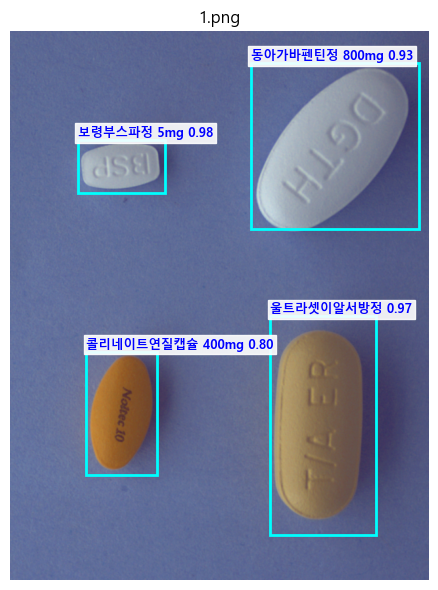

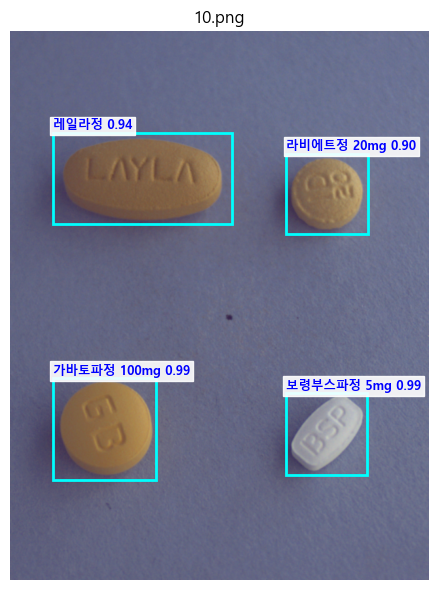

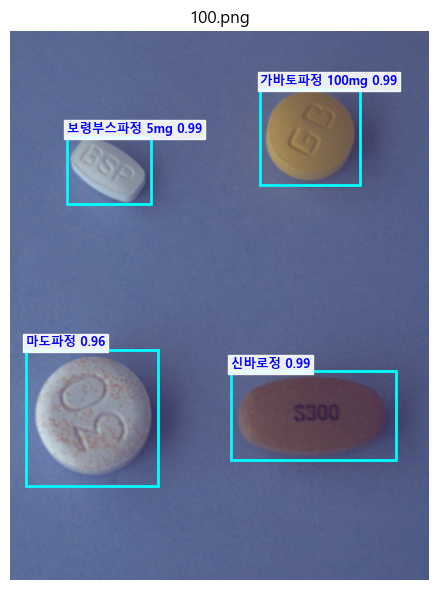

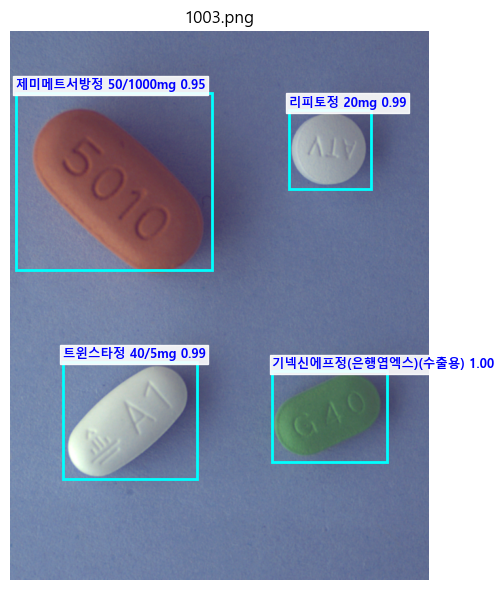

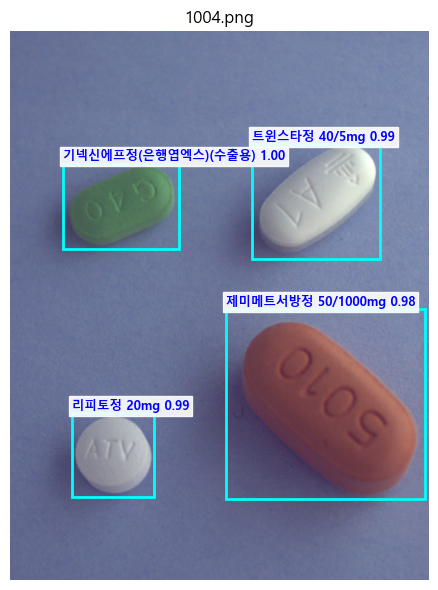

...

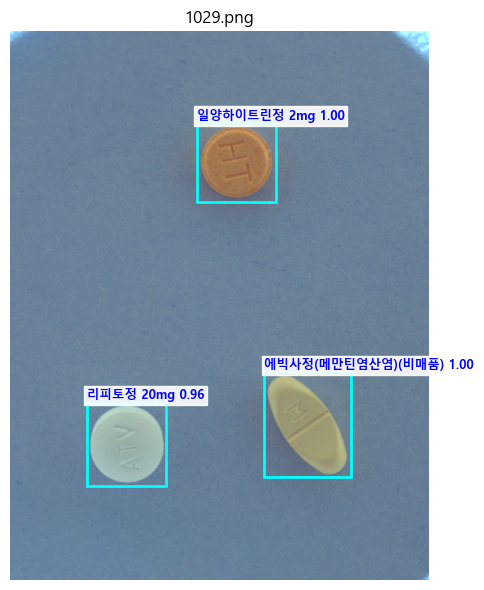

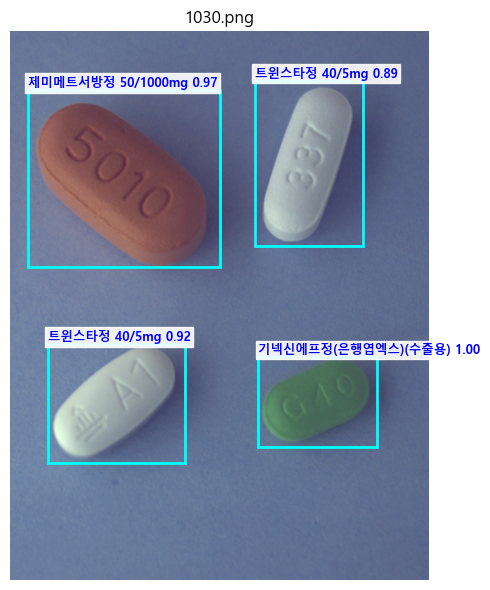

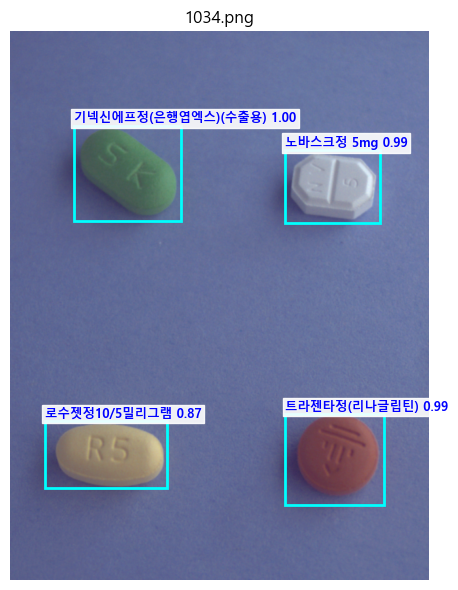

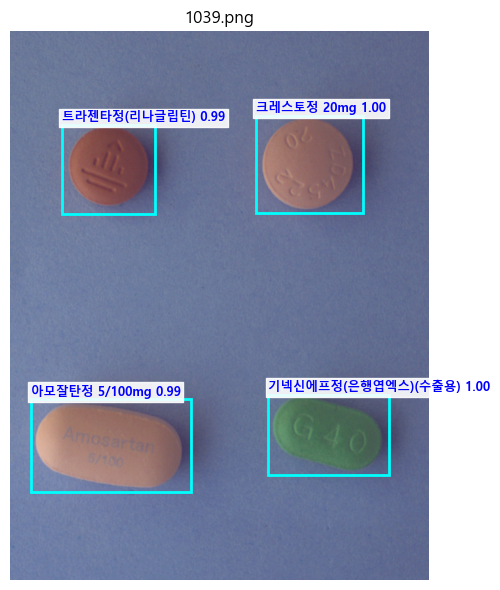

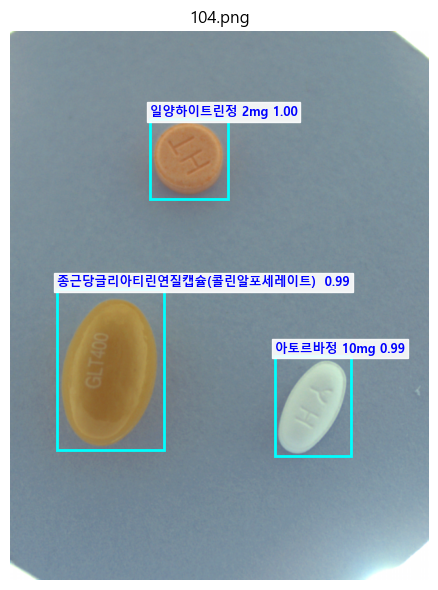

In [31]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.load_state_dict(torch.load("last_model.pth", map_location=device))

min_score = 0.5

show_test_predictions(
    model=model,
    test_loader=test_loader,
    test_dataset=test_dataset,
    model_to_catid=model_to_catid,
    catid_to_name=catid_to_name,
    device=device,
    max_images=30,
    score_thresh=min_score,
)


# 설명: 학습된 모델 로드 및 테스트 시각화 실행 예시

- `device = torch.device(...)`로 장치 설정 후 `model.load_state_dict(torch.load("last_model.pth", map_location=device))`로 저장된 가중치를 로드합니다.
- `min_score = 0.5`는 시각화에서 표시할 최소 신뢰도 임계값입니다.
- `show_test_predictions(...)`를 호출하여 테스트 데이터셋에서 예측을 시각화합니다.

### 작성 이유
- 학습 후 결과를 직접 눈으로 확인하기 위한 최종 실행 블록입니다. 학습이 잘 되었는지, 예측이 합리적인지 빠르게 체크할 수 있습니다.
- 실제 환경에서는 파일 존재 여부(`last_model.pth`)와 장치 메모리 상황을 반드시 확인해야 합니다.

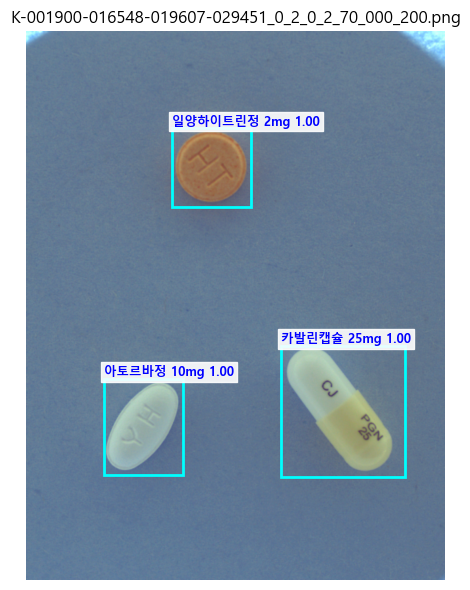

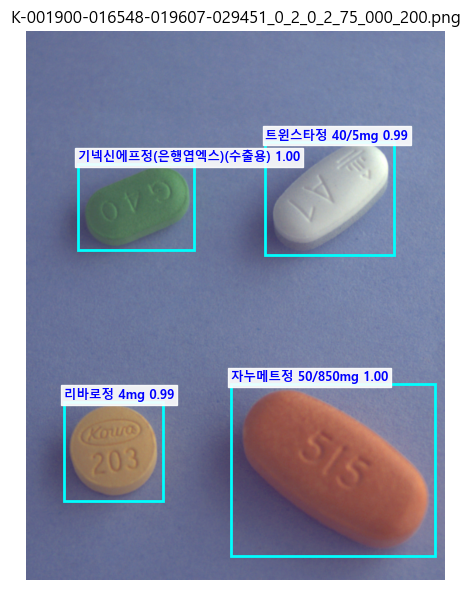

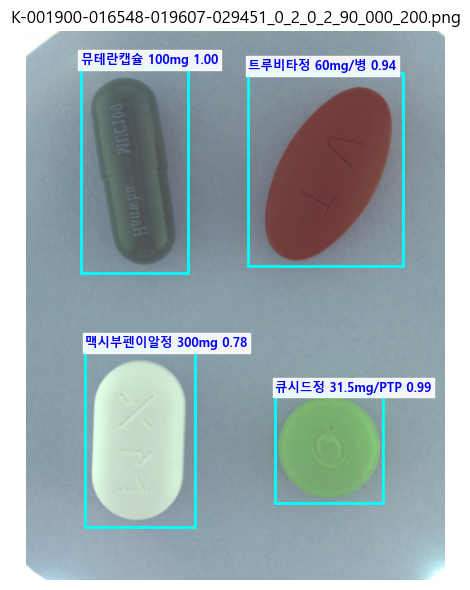

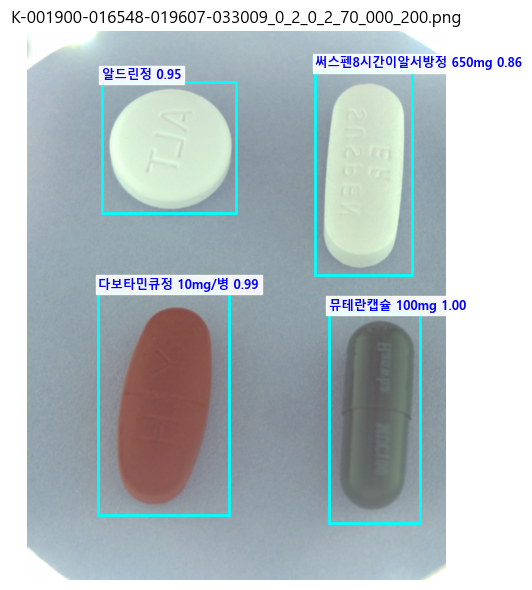

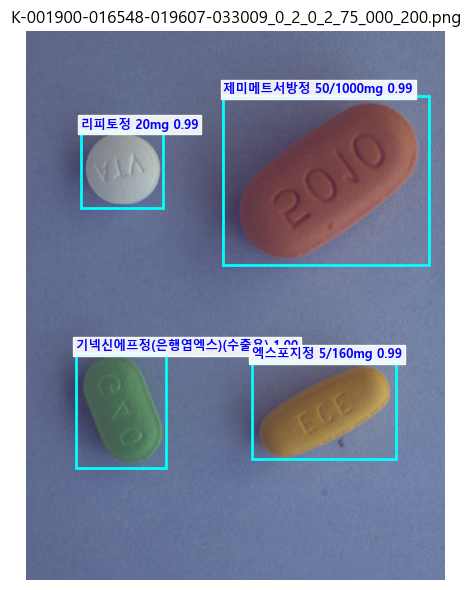

In [30]:
show_test_predictions(
    model=model,
    test_loader=train_loader,
    test_dataset=train_dataset,
    model_to_catid=model_to_catid,
    catid_to_name=catid_to_name,
    device=device,
    max_images=5,
    score_thresh=min_score,
)
